In [36]:
import glob, os
import numpy as np
import pandas as pd
from scipy.stats import pearsonr
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from colav.extract_data import *
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP

In [2]:
plt.rcParams["font.size"] = 14
# plt.rcParams["font.weight"] = "bold"
plt.rcParams["axes.labelsize"] = 16
plt.rcParams["axes.labelweight"] = "regular"
plt.rcParams["axes.titlesize"] = 16
plt.rcParams["axes.titleweight"] = "regular"

In [3]:
theseus_strucs = sorted(glob.glob("mpro_data/mpro_theseus_data/*pdb"))
resnum_bounds = (3, 297)

In [4]:
# untreated dihedral data processing
# untreated_dihedrals, dihedral_strucs = generate_dihedral_matrix(theseus_strucs,
#                                                                 resnum_bounds,
#                                                                 save=True,
#                                                                 save_prefix='mpro_data/mpro',
#                                                                 verbose=True)
untreated_dihedrals, dihedral_strucs = load_dihedral_matrix(
    "mpro_data/mpro_dh_dict.pkl"
)
untreated_dihedrals_data = np.hstack(
    [np.sin(untreated_dihedrals), np.cos(untreated_dihedrals)]
)

In [5]:
# # rope dihedral data processing
# rope_dihedrals = pd.read_csv('mpro_data/filtered-mpro.csv')
# rope_strucs = np.array([x[:-2] for x in rope_dihedrals.Name.values])
# rope_dihedrals.drop(['Unnamed: 0', 'Name'], axis=1, inplace=True)
# rope_dihedrals = np.deg2rad(rope_dihedrals.values)
# rope_dihedrals_data = np.hstack([np.sin(rope_dihedrals),
#                                  np.cos(rope_dihedrals)])

In [6]:
# pairwise distances data processing
# pw_data, pw_strucs = generate_pw_matrix(theseus_strucs,
#                                         resnum_bounds,
#                                         save=True,
#                                         save_prefix='mpro_data/mpro',
#                                         verbose=False)
pw_data, pw_strucs = load_pw_matrix("mpro_data/mpro_pw_dict.pkl")

In [7]:
# strain data processing
# sa_data, sa_strucs = generate_strain_matrix(theseus_strucs,
#                                             '../data/mpro_theseus_data/theseus_7ar5_chainA.pdb',
#                                             'sheart',
#                                             resnum_bounds,
#                                             save=True,
#                                             save_prefix='mpro_data/mpro',
#                                             verbose=False)
sa_data, sa_strucs = load_strain_matrix("mpro_data/mpro_sa_sheart_dict.pkl")

In [8]:
md_list = ["7mhl", "7mhm", "7mhn", "7mho", "7mhp", "7mhq"]
dihedral_strucs_no_md = list()
untreated_dihedrals_data_no_md = list()
for i in np.arange(len(dihedral_strucs)):
    if os.path.basename(dihedral_strucs[i]).split("_")[1] in md_list:
        continue

    dihedral_strucs_no_md.append(dihedral_strucs[i])
    untreated_dihedrals_data_no_md.append(untreated_dihedrals_data[i, :])
del dihedral_strucs
del untreated_dihedrals_data
untreated_dihedrals_data_no_md = np.array(untreated_dihedrals_data_no_md).reshape(
    len(dihedral_strucs_no_md), -1
)

In [9]:
md_list = ["7mhl", "7mhm", "7mhn", "7mho", "7mhp", "7mhq"]
pw_strucs_no_md = list()
pw_data_no_md = list()
for i in np.arange(len(pw_strucs)):
    if os.path.basename(pw_strucs[i]).split("_")[1] in md_list:
        continue

    pw_strucs_no_md.append(pw_strucs[i])
    pw_data_no_md.append(pw_data[i, :])
del pw_strucs
del pw_data
pw_data_no_md = np.array(pw_data_no_md).reshape(len(pw_strucs_no_md), -1)

In [10]:
md_list = ["7mhl", "7mhm", "7mhn", "7mho", "7mhp", "7mhq"]
sa_strucs_no_md = list()
sa_data_no_md = list()
for i in np.arange(len(sa_strucs)):
    if os.path.basename(sa_strucs[i]).split("_")[1] in md_list:
        continue

    sa_strucs_no_md.append(sa_strucs[i])
    sa_data_no_md.append(sa_data[i, :])
del sa_strucs
del sa_data
sa_data_no_md = np.array(sa_data_no_md).reshape(len(sa_strucs_no_md), -1)

In [11]:
# Dihedral PCA
# untreated
u_pca = PCA(n_components=10)
u_A = u_pca.fit_transform(untreated_dihedrals_data_no_md)

# rope
# rope_pca = PCA(n_components=10)
# rope_A = rope_pca.fit_transform(rope_dihedrals_data)

In [12]:
# Pairwise Distance PCA
pw_pca = PCA(n_components=10)
pw_A = pw_pca.fit_transform(pw_data_no_md)

In [13]:
# Strain Analysis PCA
sa_pca = PCA(n_components=10)
sa_A = sa_pca.fit_transform(sa_data_no_md)

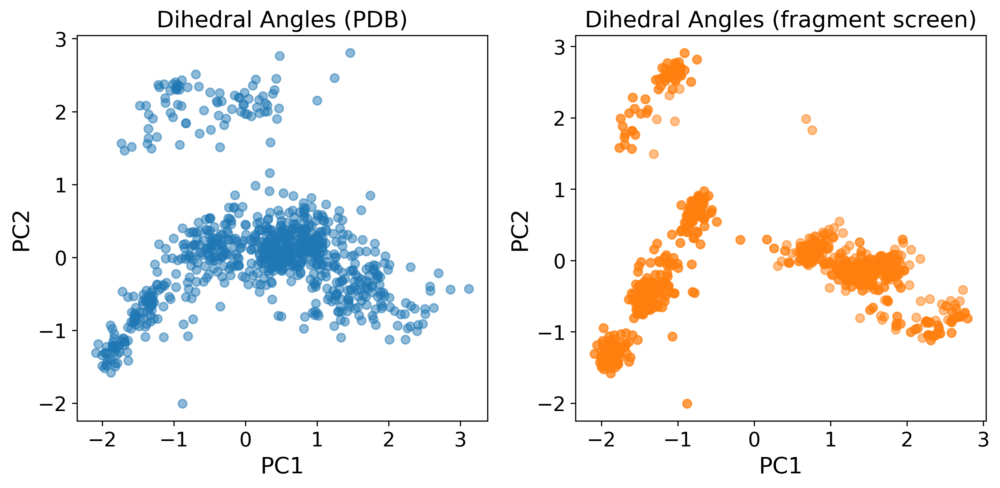

In [ ]:
# PC space plots
fig, ax = plt.subplots(1, 2, figsize=(10, 5), dpi=300)
ax = ax.flatten()
pca_list = [u_A, u_A]
struc_list_list = [dihedral_strucs_no_md, dihedral_strucs_no_md]
title_list = ["Dihedral Angles (PDB)", "Dihedral Angles (fragment screen)"]

# enumerate the axes and the list of the PCAs
for i in np.arange(len(pca_list)):
    # determine conformation color
    #     conformations = list()
    #     for k in struc_list_list[i]:
    #         if k.startswith('../data'):
    #             conformations.append(conformation_dict[k.split('/')[-1][8:-4]])
    #         else:
    #             conformations.append(conformation_dict[k])

    #     conformations = np.array(conformations)
    #     cluster1 = ax[i].scatter(pca_list[i][conformations == "open_open",0], pca_list[i][conformations == "open_open",1], marker='o', alpha=0.5, edgecolor='k', linewidth=1, label="open/open")
    #     cluster2 = ax[i].scatter(pca_list[i][conformations == "open_closed",0], pca_list[i][conformations == "open_closed",1], marker='o', alpha=0.5, edgecolor='k', linewidth=1, label="open/closed")
    #     cluster3 = ax[i].scatter(pca_list[i][conformations == "closed_open",0], pca_list[i][conformations == "closed_open",1], marker='o', alpha=0.5, edgecolor='k', linewidth=1, label="closed/open")
    #     cluster4 = ax[i].scatter(pca_list[i][conformations == "closed_closed",0], pca_list[i][conformations == "closed_closed",1], marker='o', alpha=0.5, edgecolor='k', linewidth=1, label="closed/closed")
    if i == 0:
        ax[i].scatter(
            u_A[
                [
                    os.path.basename(x).split("_")[1][0] < "A"
                    for x in dihedral_strucs_no_md
                ],
                0,
            ],
            u_A[
                [
                    os.path.basename(x).split("_")[1][0] < "A"
                    for x in dihedral_strucs_no_md
                ],
                1,
            ],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            color="#1f77b4",
        )
    else:
        ax[i].scatter(
            u_A[
                [
                    os.path.basename(x).split("_")[1][0] > "A"
                    for x in dihedral_strucs_no_md
                ],
                0,
            ],
            u_A[
                [
                    os.path.basename(x).split("_")[1][0] > "A"
                    for x in dihedral_strucs_no_md
                ],
                1,
            ],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            color="#ff7f0e",
        )
    ax[i].set_ylabel("PC2")
    ax[i].set_xlabel("PC1")
    ax[i].set_title(title_list[i])
# ax[0].legend(loc="upper left", handles=[cluster1, cluster2, cluster3, cluster4], labels=["open/open", "open/closed", "closed/open", "closed/closed"])
plt.tight_layout()
plt.show()

In [15]:
# transition between PDB structures and fragalysis structures is at index 1112 (J0013_0A_chainA)

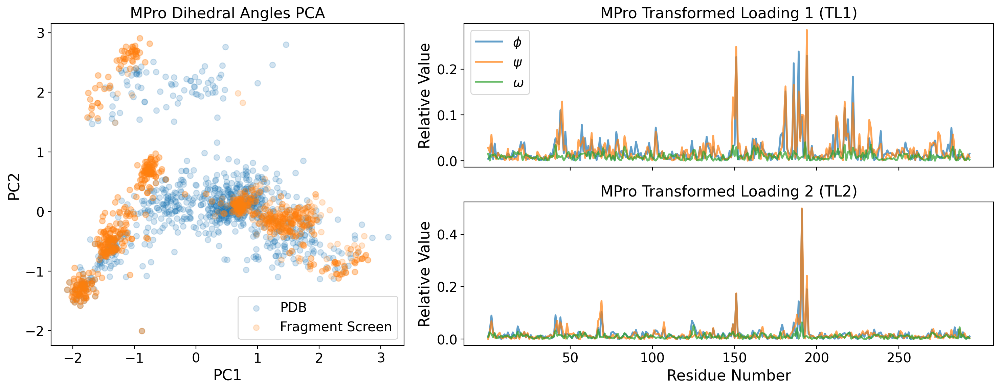

In [17]:
gs_kw = dict(width_ratios=[1, 1.5], height_ratios=[1, 1])
fig, axd = plt.subplot_mosaic(
    [["left", "upper right"], ["left", "lower right"]],
    gridspec_kw=gs_kw,
    figsize=(15, 6),
    layout="constrained",
    dpi=200,
)
for i, ax in enumerate(axd):
    if i == 0:
        axd[ax].scatter(
            u_A[
                [
                    os.path.basename(x).split("_")[1][0] < "A"
                    for x in dihedral_strucs_no_md
                ],
                0,
            ],
            u_A[
                [
                    os.path.basename(x).split("_")[1][0] < "A"
                    for x in dihedral_strucs_no_md
                ],
                1,
            ],
            marker="o",
            alpha=0.2,
            edgecolor=None,
            c="#1f77b4",
            label="PDB",
        )
        axd[ax].scatter(
            u_A[
                [
                    os.path.basename(x).split("_")[1][0] > "A"
                    for x in dihedral_strucs_no_md
                ],
                0,
            ],
            u_A[
                [
                    os.path.basename(x).split("_")[1][0] > "A"
                    for x in dihedral_strucs_no_md
                ],
                1,
            ],
            marker="o",
            alpha=0.2,
            edgecolor=None,
            c="#ff7f0e",
            label="Fragment Screen",
        )
        axd[ax].set_ylabel("PC2")
        axd[ax].set_xlabel("PC1")
        axd[ax].set_title("MPro Dihedral Angles PCA")
        axd[ax].legend(loc="best")

    else:
        psi_idx = np.arange(0, untreated_dihedrals_data_no_md.shape[1] // 2, 3)
        omg_idx = np.arange(1, untreated_dihedrals_data_no_md.shape[1] // 2, 3)
        phi_idx = np.arange(2, untreated_dihedrals_data_no_md.shape[1] // 2, 3)
        dh_range = np.arange(resnum_bounds[0], resnum_bounds[1] + 1)
        (phi_trace,) = axd[ax].plot(
            calculate_dh_tl(u_pca.components_[i - 1])[phi_idx],
            "-",
            label=r"$\phi$",
            linewidth=2,
            alpha=0.7,
        )
        (psi_trace,) = axd[ax].plot(
            calculate_dh_tl(u_pca.components_[i - 1])[psi_idx],
            "-",
            label=r"$\psi$",
            linewidth=2,
            alpha=0.7,
        )
        (omg_trace,) = axd[ax].plot(
            calculate_dh_tl(u_pca.components_[i - 1])[omg_idx],
            "-",
            label=r"$\omega$",
            linewidth=2,
            alpha=0.7,
        )

        axd[ax].set_title(f"MPro Transformed Loading {i} (TL{i})")
        axd[ax].set_xticks(
            [dh for dh in dh_range if dh % 50 == 0],
            labels=[dh for dh in dh_range if dh % 50 == 0],
        )
        axd[ax].set_ylabel("Relative Value")
axd["upper right"].set_xticklabels([])
axd["upper right"].legend(loc="upper left")
axd["lower right"].set_xlabel("Residue Number")
plt.tight_layout()
plt.show()

In [ ]:
# # PC space plots
# fig, ax = plt.subplots(3, 3, figsize=(15,15), dpi=100); ax = ax.flatten()

# # enumerate the axes and the list of the PCAs
# for i in np.arange(9):
#     ax[i].scatter(u_A[:,i],
#                   u_A[:,i+1],
#                   marker='o',
#                   alpha=0.5,
#                   edgecolor=None,
#                   linewidth=1
#                  )
#     ax[i].set_ylabel(f"PC{i+2}")
#     ax[i].set_xlabel(f"PC{i+1}")
#     ax[i].set_title(f"PC{i+1} v. PC{i+2}")
# # ax[0].legend(loc="upper left", handles=[cluster1, cluster2, cluster3, cluster4], labels=["open/open", "open/closed", "closed/open", "closed/closed"])
# plt.tight_layout()
# plt.show()

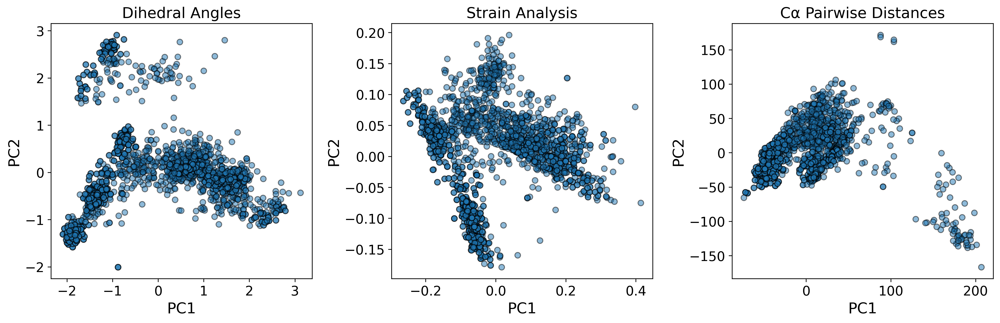

In [21]:
# PC space plots
fig, ax = plt.subplots(1, 3, figsize=(15, 5), dpi=300)
ax = ax.flatten()
pca_list = [u_A, sa_A, pw_A]
struc_list_list = [dihedral_strucs_no_md, sa_strucs_no_md, pw_strucs_no_md]
title_list = ["Dihedral Angles", "Strain Analysis", "C\u03b1 Pairwise Distances"]

# enumerate the axes and the list of the PCAs
for i in np.arange(len(pca_list)):
    #     # determine conformation color
    #     conformations = list()
    #     for k in struc_list_list[i]:
    #         if k.startswith('../data'):
    #             conformations.append(conformation_dict[k.split('/')[-1][8:-4]])
    #         else:
    #             conformations.append(conformation_dict[k])

    #     conformations = np.array(conformations)
    #     cluster1 = ax[i].scatter(pca_list[i][conformations == "open_open",0], pca_list[i][conformations == "open_open",1], marker='o', alpha=0.5, edgecolor='k', linewidth=1, label="open/open")
    #     cluster2 = ax[i].scatter(pca_list[i][conformations == "open_closed",0], pca_list[i][conformations == "open_closed",1], marker='o', alpha=0.5, edgecolor='k', linewidth=1, label="open/closed")
    #     cluster3 = ax[i].scatter(pca_list[i][conformations == "closed_open",0], pca_list[i][conformations == "closed_open",1], marker='o', alpha=0.5, edgecolor='k', linewidth=1, label="closed/open")
    #     cluster4 = ax[i].scatter(pca_list[i][conformations == "closed_closed",0], pca_list[i][conformations == "closed_closed",1], marker='o', alpha=0.5, edgecolor='k', linewidth=1, label="closed/closed")
    ax[i].scatter(
        pca_list[i][:, 0],
        pca_list[i][:, 1],
        marker="o",
        alpha=0.5,
        edgecolor="k",
        linewidth=1,
    )
    ax[i].set_ylabel("PC2")
    ax[i].set_xlabel("PC1")
    ax[i].set_title(title_list[i])
# ax[0].legend(loc="upper left", handles=[cluster1, cluster2, cluster3, cluster4], labels=["open/open", "open/closed", "closed/open", "closed/closed"])
plt.tight_layout()
plt.show()

In [ ]:
# space_group_dict = pickle.load(open('ptp1b_sg_dict.pkl', 'rb'))

In [ ]:
# # determine the space groups of each of the structures
# sgs = list()
# for i,struc in enumerate(rope_strucs):
#     sgs.append(space_group_dict[struc.split('_')[0]])
# sgs = np.array(sgs)

# # PC plot by space group
# fig, ax = plt.subplots(1, 3, figsize=(15,5), dpi=300); ax = ax.flatten()
# for k in np.arange(3):
#     for i,sg in enumerate(np.unique(sgs)):
#         ax[k].scatter(rope_A[sgs == sg,0], rope_A[sgs == sg,1], marker='o', edgecolor='k', label=f"{sg} (n = {(sgs== sg).sum()})", alpha=0.5)
#     ax[k].set_xlabel("PC1")
#     ax[k].set_ylabel("PC2")
#     ax[k].set_title("RoPE Dihedral Angles by Space Group")
# ax[0].legend()
# plt.tight_layout()
# plt.show()

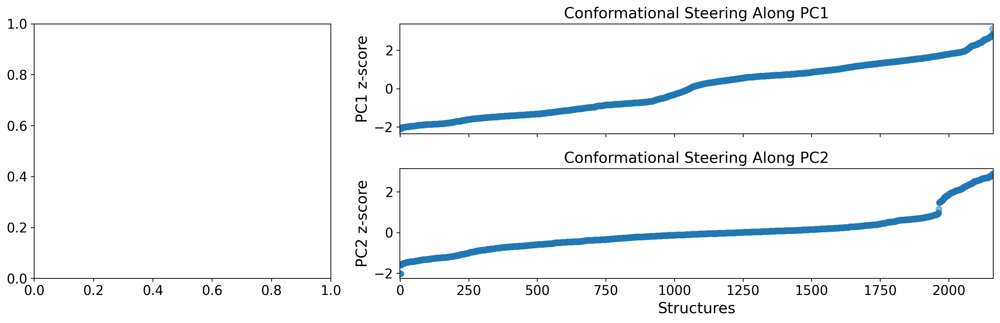

In [22]:
# allosteric steering for rope dihedrals
gs_kw = dict(width_ratios=[1, 2], height_ratios=[1, 1])
fig, axd = plt.subplot_mosaic(
    [["left", "upper right"], ["left", "lower right"]],
    gridspec_kw=gs_kw,
    figsize=(15, 5),
    layout="constrained",
    dpi=200,
)
pc1_idxs = np.argsort(u_A[:, 0])
pc2_idxs = np.argsort(u_A[:, 1])
idx_list = [pc1_idxs, pc2_idxs]
for idx, ax in enumerate(axd):
    if idx == 0:
        pass
    else:
        c_dict = {
            "open_open": "#1f77b4",
            "open_closed": "#ff7f0e",
            "closed_open": "#2ca02c",
            "closed_closed": "#d62728",
        }
        #         conformations = list()
        #         for i in dihedral_strucs[idx_list[idx-1]]:
        #             if i.startswith('../data'):
        #                 conformations.append(c_dict[conformation_dict[i.split('/')[-1][8:-4]]])
        #             else:
        #                 conformations.append(c_dict[conformation_dict[i]])
        #         conformations = np.array(conformations)

        #         axd[ax].scatter(np.arange(rope_A.shape[0]), rope_A[idx_list[idx-1],idx-1], c=conformations, alpha=0.5, marker='o', edgecolor='k')
        axd[ax].scatter(
            np.arange(u_A.shape[0]),
            u_A[idx_list[idx - 1], idx - 1],
            marker="o",
            alpha=0.5,
        )
        axd[ax].set_ylabel(f"PC{idx} z-score")
        axd[ax].set_title(f"Conformational Steering Along PC{idx}")
        axd[ax].set_xlim(left=-1, right=u_A.shape[0] + 1)

        #         axd['upper right'].legend(loc="upper left",
        #                                   handles=[cluster1, cluster2, cluster3, cluster4],
        #                                   labels=["open/open", "open/closed", "closed/open", "closed/closed"]
        #                                  )
        axd["upper right"].set_xticklabels([])
        axd["lower right"].set_xlabel("Structures")
plt.tight_layout()
plt.show()

In [24]:
# calculate t-SNE and UMAP
u_tsne = TSNE(random_state=0)
u_umap = UMAP(n_neighbors=50, random_state=0)
u_tsne_transform = u_tsne.fit_transform(untreated_dihedrals_data_no_md)
u_umap_transform = u_umap.fit_transform(untreated_dihedrals_data_no_md)

pw_tsne = TSNE(random_state=0)
pw_umap = UMAP(n_neighbors=50, random_state=0)
pw_tsne_transform = pw_tsne.fit_transform(pw_data_no_md)
pw_umap_transform = pw_umap.fit_transform(pw_data_no_md)

sa_tsne = TSNE(random_state=0)
sa_umap = UMAP(n_neighbors=50, random_state=0)
sa_tsne_transform = sa_tsne.fit_transform(sa_data_no_md)
sa_umap_transform = sa_umap.fit_transform(sa_data_no_md)

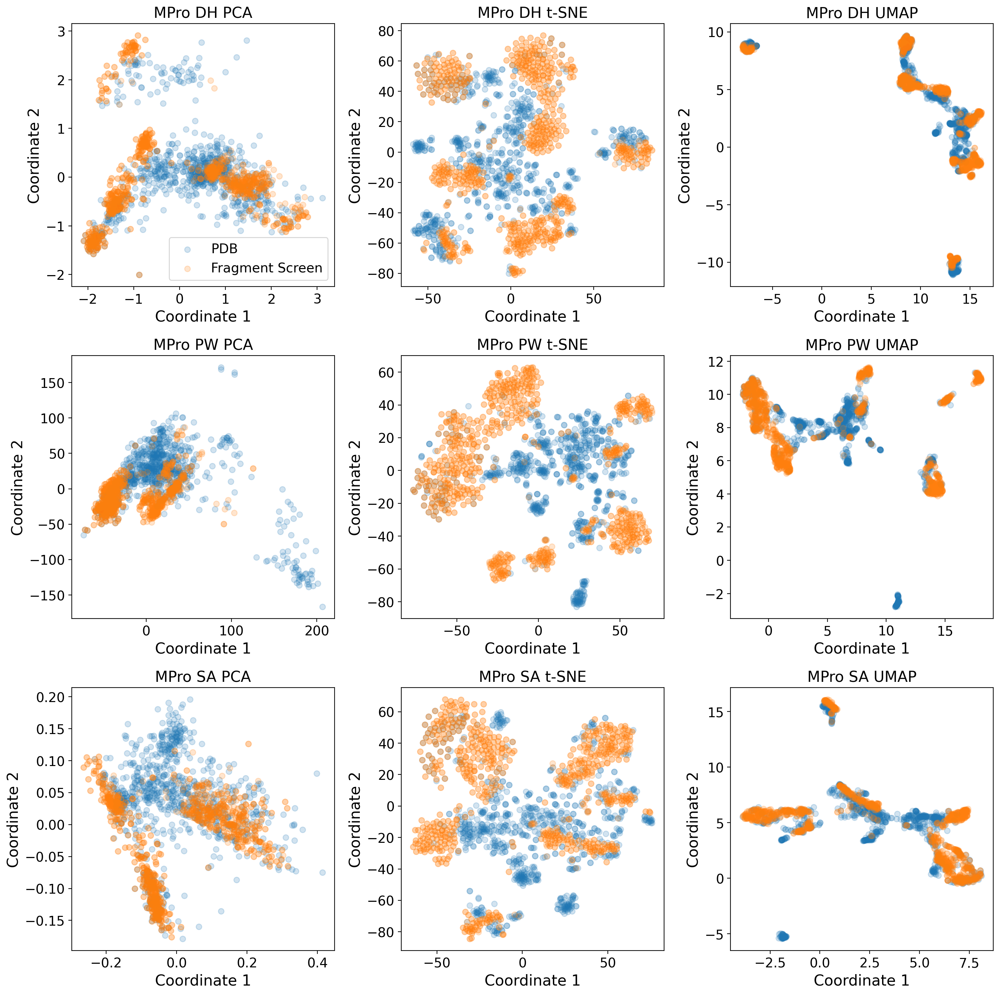

In [155]:
fig, ax = plt.subplots(3, 3, figsize=(15, 15), dpi=200)
ax = ax.flatten()
transform_list = [
    u_A,
    u_tsne_transform,
    u_umap_transform,
    pw_A,
    pw_tsne_transform,
    pw_umap_transform,
    sa_A,
    sa_tsne_transform,
    sa_umap_transform,
]
struc_list_list = [
    dihedral_strucs_no_md,
    dihedral_strucs_no_md,
    dihedral_strucs_no_md,
    pw_strucs_no_md,
    pw_strucs_no_md,
    pw_strucs_no_md,
    sa_strucs_no_md,
    sa_strucs_no_md,
    sa_strucs_no_md,
]
title_list = [
    "DH PCA",
    "DH t-SNE",
    "DH UMAP",
    "PW PCA",
    "PW t-SNE",
    "PW UMAP",
    "SA PCA",
    "SA t-SNE",
    "SA UMAP",
]

for i in np.arange(len(transform_list)):
    # determine color based on origin
    ax[i].scatter(
        transform_list[i][
            [os.path.basename(x).split("_")[1][0] < "A" for x in struc_list_list[i]], 0
        ],
        transform_list[i][
            [os.path.basename(x).split("_")[1][0] < "A" for x in struc_list_list[i]], 1
        ],
        marker="o",
        alpha=0.2,
        edgecolor=None,
        c="#1f77b4",
        label="PDB",
    )
    ax[i].scatter(
        transform_list[i][
            [os.path.basename(x).split("_")[1][0] > "A" for x in struc_list_list[i]], 0
        ],
        transform_list[i][
            [os.path.basename(x).split("_")[1][0] > "A" for x in struc_list_list[i]], 1
        ],
        marker="o",
        alpha=0.2,
        edgecolor=None,
        c="#ff7f0e",
        label="Fragment Screen",
    )
    ax[i].set_ylabel("Coordinate 2")
    ax[i].set_xlabel("Coordinate 1")
    ax[i].set_title("MPro " + title_list[i])
ax[0].legend(loc="best")
plt.tight_layout()
plt.show()

In [57]:
# create array for BICs
bics = list()
covariance_type = ["full", "tied", "diag", "spherical"]
# fit a GMM to determine number of unique conformations
for k in np.arange(50):
    for covariance in covariance_type:
        # initialize a GMM w/ k components
        gm = GaussianMixture(
            n_components=k + 1, random_state=0, covariance_type=covariance
        ).fit(untreated_dihedrals_data_no_md)
        print(k + 1, covariance, gm.bic(untreated_dihedrals_data_no_md))
        bics.append(gm.bic(untreated_dihedrals_data_no_md))

1 full -15025828.727211284
1 tied -15025828.727236656
1 diag -14450448.76803787
1 spherical -8292228.207039309
2 full -8843074.553039342
2 tied -15023000.766205143
2 diag -15343572.415748015
2 spherical -9135770.418439986
3 full 832460.2174342498
3 tied -15017884.70671433
3 diag -16753884.256743016
3 spherical -9469463.60156846
4 full 10970808.853043236
4 tied -15018581.153821487
4 diag -17470637.950758733
4 spherical -10073672.187747547
5 full 22348809.377927274
5 tied -15027541.510107366
5 diag -17204942.97689988
5 spherical -10379400.365907593
6 full 34118414.77346912
6 tied -15021395.877176404
6 diag -17345802.26480641
6 spherical -10537927.57317467
7 full 46021079.516360834
7 tied -15015622.543222604
7 diag -17970645.80019109
7 spherical -10733099.418735163
8 full 55541173.46602993
8 tied -15010287.165648147
8 diag -17926021.333511353
8 spherical -10781375.869911922
9 full 67172169.99904668
9 tied -15005495.75047006
9 diag -17967055.659954038
9 spherical -10823611.31013561
10 full

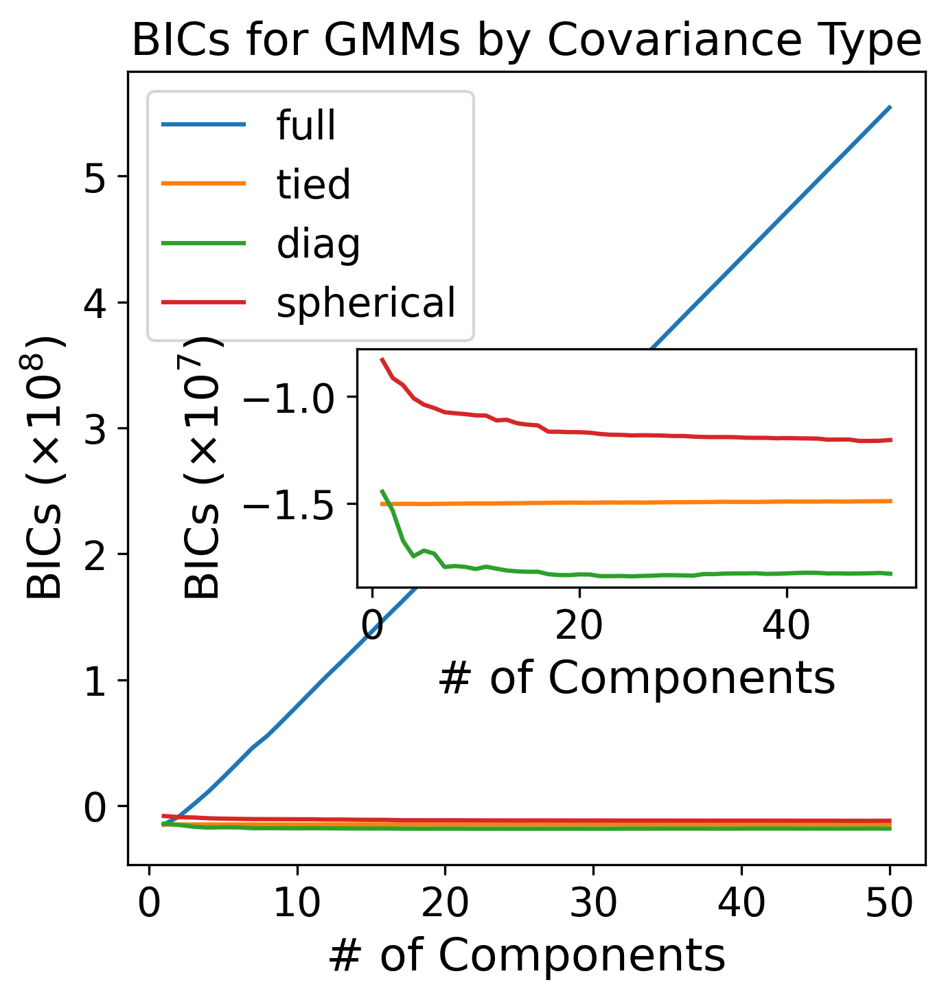

In [154]:
# import functions and objects for making the figure
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# from matplotlib.patches import Rectangle
# from matplotlib.lines import Line2D

# create the figure
fig, ax = plt.subplots(figsize=(5, 5), dpi=300)

# plot the different BICs for each covariance type
ax.plot(
    np.arange(1, 51),
    np.array(bics)[np.arange(0, 200, 4)] / 1e8,
    label="full",
    color="#1f77b4",
)
ax.plot(
    np.arange(1, 51),
    np.array(bics)[np.arange(1, 200, 4)] / 1e8,
    label="tied",
    color="#ff7f0e",
)
ax.plot(
    np.arange(1, 51),
    np.array(bics)[np.arange(2, 200, 4)] / 1e8,
    label="diag",
    color="#2ca02c",
)
ax.plot(
    np.arange(1, 51),
    np.array(bics)[np.arange(3, 200, 4)] / 1e8,
    label="spherical",
    color="#d62728",
)
ax.set_xlabel("# of Components")
ax.set_ylabel("BICs " + r"$(\times 10^8)$")
ax.set_title("BICs for GMMs by Covariance Type")
plt.legend()

# create the inset
axins = inset_axes(ax, width="70%", height="30%", loc=5, borderpad=0.25)
axins.tick_params(labelleft=True, labelbottom=True)

# cycle through the different covariance types for the inset
axins.plot(
    np.arange(1, 51),
    np.array(bics)[np.arange(1, 200, 4)] / 1e7,
    label="tied",
    color="#ff7f0e",
)
axins.plot(
    np.arange(1, 51),
    np.array(bics)[np.arange(2, 200, 4)] / 1e7,
    label="diag",
    color="#2ca02c",
)
axins.plot(
    np.arange(1, 51),
    np.array(bics)[np.arange(3, 200, 4)] / 1e7,
    label="spherical",
    color="#d62728",
)
axins.set_ylabel("BICs " + r"$(\times 10^7)$")
axins.set_xlabel("# of Components")

plt.show()

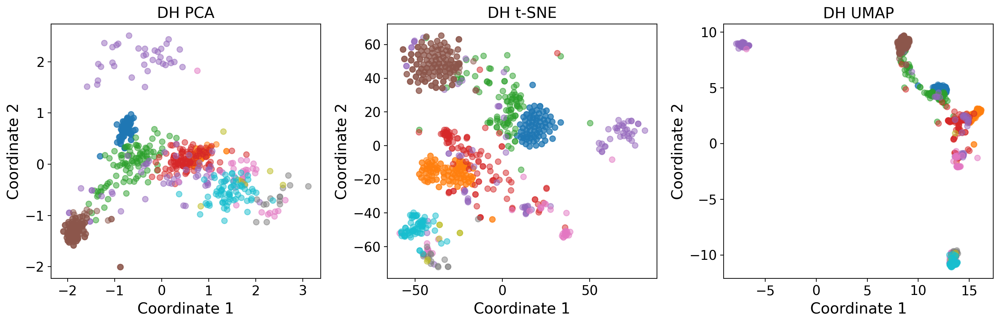

In [66]:
fig, ax = plt.subplots(1, 3, figsize=(15, 5), dpi=200)
ax = ax.flatten()
transform_list = [
    u_A,
    u_tsne_transform,
    u_umap_transform,
    #     pw_A,
    #     pw_tsne_transform,
    #     pw_umap_transform,
    #     sa_A,
    #     sa_tsne_transform,
    #     sa_umap_transform
]
struc_list_list = [
    dihedral_strucs_no_md,
    dihedral_strucs_no_md,
    dihedral_strucs_no_md,
    #     pw_strucs_no_md,
    #     pw_strucs_no_md,
    #     pw_strucs_no_md,
    #     sa_strucs_no_md,
    #     sa_strucs_no_md,
    #     sa_strucs_no_md
]
title_list = [
    "DH PCA",
    "DH t-SNE",
    "DH UMAP",
    #     "PW PCA",
    #     "PW t-SNE",
    #     "PW UMAP",
    #     "SA PCA",
    #     "SA t-SNE",
    #     "SA UMAP"
]

# use a Gaussian Mixture Model (GMM) to predict conformations
gm = GaussianMixture(n_components=25, random_state=0, covariance_type="diag").fit(
    untreated_dihedrals_data_no_md
)

for i in np.arange(len(transform_list)):
    for j in np.arange(10):
        # determine color based on origin
        ax[i].scatter(
            transform_list[i][gm.predict(untreated_dihedrals_data_no_md) == j, 0],
            transform_list[i][gm.predict(untreated_dihedrals_data_no_md) == j, 1],
            marker="o",
            alpha=0.5,
            edgecolor=None,
            #                       c='#1f77b4',
            label=f"conformation {j+1}",
        )
    #         ax[i].scatter(transform_list[i][gm.predict(untreated_dihedrals_data_no_md)==,0],
    #                       transform_list[i][gm.predict(untreated_dihedrals_data_no_md)==1,1],
    #                       marker='o',
    #                       alpha=0.5,
    #                       edgecolor=None,
    #                       c='#ff7f0e',
    #                       label='conformation 2'
    #                  )
    ax[i].set_ylabel("Coordinate 2")
    ax[i].set_xlabel("Coordinate 1")
    ax[i].set_title(title_list[i])
plt.tight_layout()
plt.show()

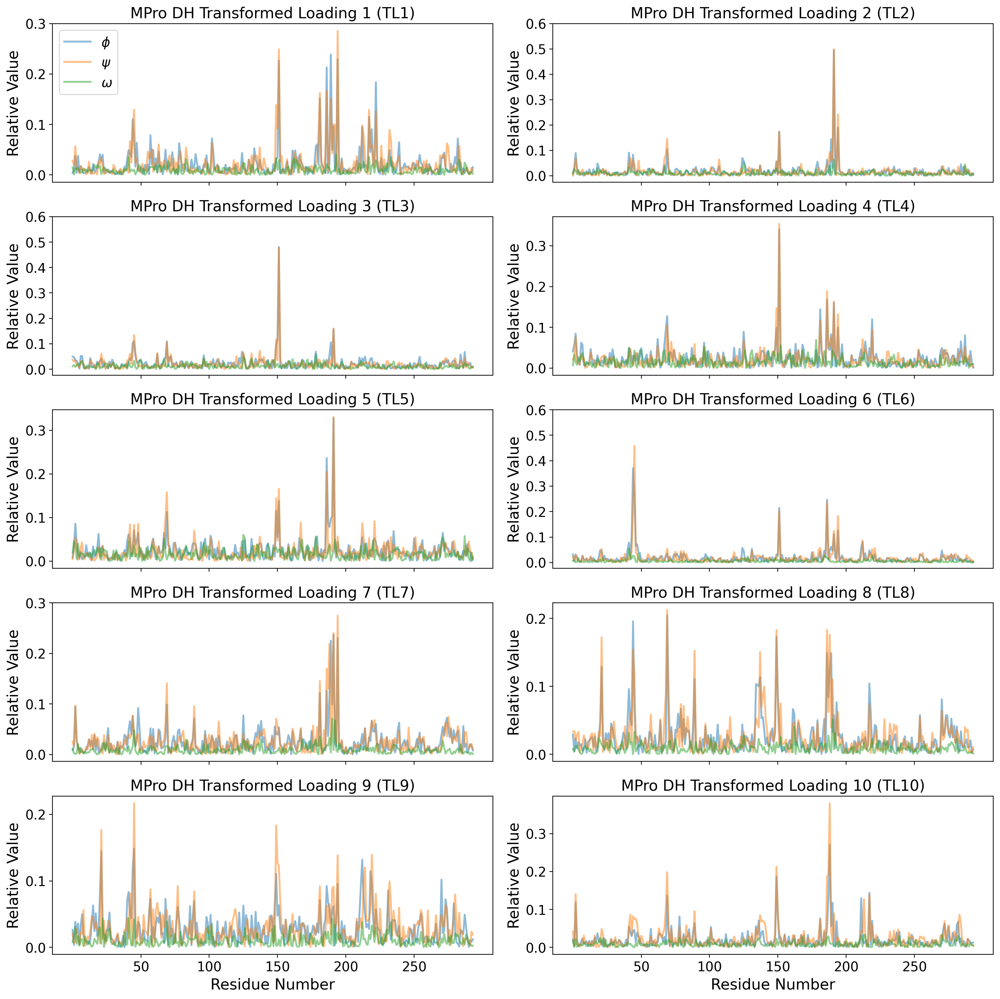

In [69]:
# rope fragment treated dihedrals
r = 10
r_list = [r - 1, r - 2]
fig, ax = plt.subplots(r // 2, 2, figsize=(15, 15), dpi=200)
ax = ax.flatten()
psi_idx = np.arange(0, untreated_dihedrals_data_no_md.shape[1] // 2, 3)
omg_idx = np.arange(1, untreated_dihedrals_data_no_md.shape[1] // 2, 3)
phi_idx = np.arange(2, untreated_dihedrals_data_no_md.shape[1] // 2, 3)
dh_range = np.arange(resnum_bounds[0], resnum_bounds[1] + 1)
for k in np.arange(r):
    (phi_trace,) = ax[k].plot(
        calculate_dh_tl(u_pca.components_[k])[phi_idx],
        "-",
        label=r"$\phi$",
        linewidth=2,
        alpha=0.5,
    )
    (psi_trace,) = ax[k].plot(
        calculate_dh_tl(u_pca.components_[k])[psi_idx],
        "-",
        label=r"$\psi$",
        linewidth=2,
        alpha=0.5,
    )
    (omg_trace,) = ax[k].plot(
        calculate_dh_tl(u_pca.components_[k])[omg_idx],
        "-",
        label=r"$\omega$",
        linewidth=2,
        alpha=0.5,
    )

    ax[k].set_title(f"MPro DH Transformed Loading {k+1} (TL{k+1})")
    ax[k].set_xticks(
        [dh for dh in dh_range if dh % 50 == 0],
        labels=[dh for dh in dh_range if dh % 50 == 0],
    )
    ax[k].set_yticks(
        np.arange(0, ax[k].get_yticks().max(), 0.1),
        labels=np.round(np.arange(0, ax[k].get_yticks().max(), 0.1), 2),
    )
    ax[k].set_ylabel("Relative Value")
    if k not in r_list:
        ax[k].set_xticklabels([])
ax[0].legend(loc="upper left")
ax[-1].set_xlabel("Residue Number")
ax[-2].set_xlabel("Residue Number")
plt.tight_layout()
plt.show()

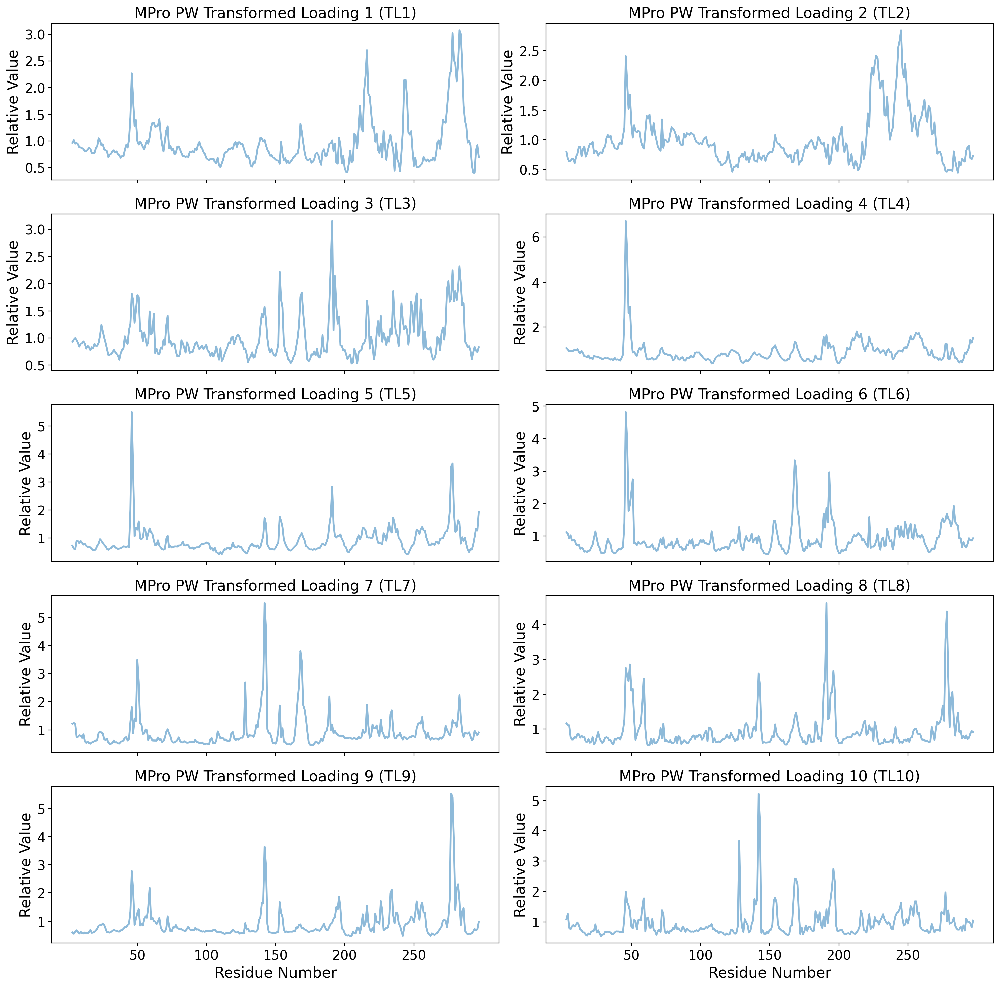

In [70]:
# pairwise distances tranformed loadings
r = 10
r_list = [r - 1, r - 2]
fig, ax = plt.subplots(r // 2, 2, figsize=(15, 15), dpi=200)
ax = ax.flatten()

for k in np.arange(r):
    ax[k].plot(
        np.arange(resnum_bounds[0], resnum_bounds[1] + 1),
        calculate_pw_tl(pw_pca.components_[k], resnum_bounds),
        "-",
        linewidth=2,
        alpha=0.5,
    )
    ax[k].set_title(f"MPro PW Transformed Loading {k+1} (TL{k+1})")
    ax[k].set_xticks(
        [x for x in np.arange(resnum_bounds[0], resnum_bounds[1] + 1) if x % 50 == 0],
        labels=[
            x for x in np.arange(resnum_bounds[0], resnum_bounds[1]) if x % 50 == 0
        ],
    )

    ax[k].set_ylabel("Relative Value")
    if k not in r_list:
        ax[k].set_xticklabels([])
ax[-1].set_xlabel("Residue Number")
ax[-2].set_xlabel("Residue Number")
plt.tight_layout()
plt.show()

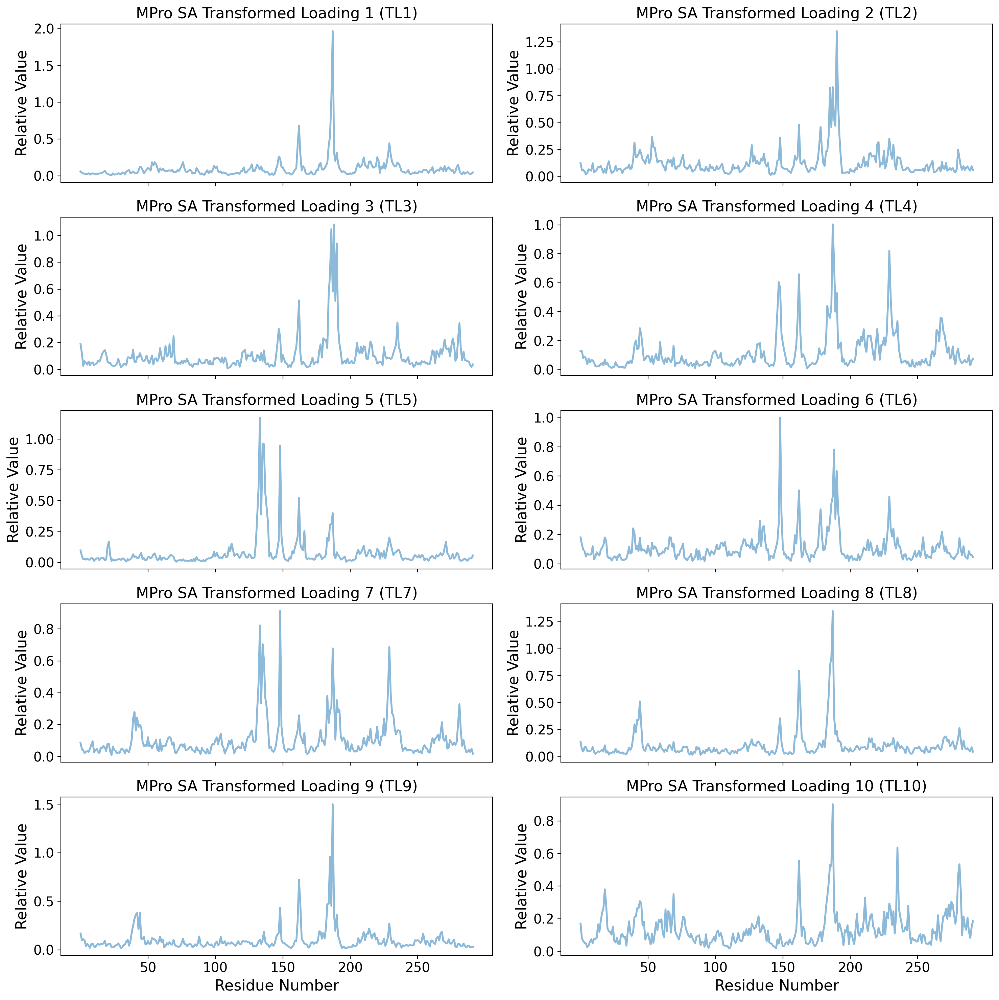

In [71]:
# strain analysis tranformed loadings
r = 10
r_list = [r - 1, r - 2]
fig, ax = plt.subplots(r // 2, 2, figsize=(15, 15), dpi=200)
ax = ax.flatten()
shared_atom_set = pickle.load(open("mpro_data/mpro_atom_set.pkl", "rb"))

for k in np.arange(r):
    ax[k].plot(
        calculate_sa_tl(sa_pca.components_[k], sorted(shared_atom_set)),
        "-",
        linewidth=2,
        alpha=0.5,
    )
    ax[k].set_title(f"MPro SA Transformed Loading {k+1} (TL{k+1})")
    ax[k].set_xticks(
        [x for x in np.arange(resnum_bounds[0], resnum_bounds[1] + 1) if x % 50 == 0],
        labels=[
            x for x in np.arange(resnum_bounds[0], resnum_bounds[1]) if x % 50 == 0
        ],
    )

    ax[k].set_ylabel("Relative Value")
    if k not in r_list:
        ax[k].set_xticklabels([])
ax[-1].set_xlabel("Residue Number")
ax[-2].set_xlabel("Residue Number")
plt.tight_layout()
plt.show()